<h1> Amazon Apparel Recommendations(Content Based recommendation) </h1>



<td><img src="Untitled.png"></td>

In [1]:
#import all the necessary packages.
import PIL
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
# we have give a json file which consists of all information about
# the products
# loading the data using pandas' read_json file.
data = pd.read_json('tops_fashion.json')

In [3]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [4]:
# each product/item has 19 features in the raw dataset.
data.columns # prints column-names or feature-names.

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [5]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [6]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() # prints the top rows in the table.

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


###  Missing data for various features.

####  Basic stats for the feature: product_type_name

In [7]:
# We have total 72 unique type of product_type_names
print(data['product_type_name'].describe())

# 91.62% (167794/183138) of the products are shirts,


count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [8]:
# names of different product types
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [9]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

####  Basic stats for the feature: brand

In [10]:
# there are 10577 unique brands
print(data['brand'].describe())

# 183138 - 182987 = 151 missing values.

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [11]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

####  Basic stats for the feature: color

In [12]:
print(data['color'].describe())
# we have 7380 unique colors
# 7.2% of products are black in color
# 64956 of 183138 products have brand information. That's approx 35.4%.

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [13]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

####  Basic stats for the feature: formatted_price

In [14]:
 
print(data['formatted_price'].describe())

# Only 28,395 (15.5% of whole data) products with price information

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [15]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

#### Basic stats for the feature: title


In [16]:
print(data['title'].describe())

# All of the products have a title. 
# Titles are fairly descriptive of what the product is. 
# We use titles extensively in this workshop 
# as they are short and informative.


count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [ ]:
data.to_pickle('pickels/180k_apparel_data')

   We save data files at every major step in our processing in "pickle" files. If you are stuck anywhere (or) if some code takes too long to run on your laptop, you may use the pickle files we give you to speed things up.

In [17]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [18]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


#### We brought down the number of data points from 183K  to 28K by removing a null value from the price and color feature, yes it's not the right way to handle null values but for the fast computation, we do these things here.

### Remove near duplicate items

#### Understand about duplicates.

In [ ]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')
# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))
# we have 2325 products which have same title but different color

2325


### These shirts are exactly same except in size (S, M)

<tr> 
<td><img src="B00JV3O30K.jpeg",width=200,height=100> </td>
<td><img src="B00JV3O9M2.jpeg",width=170,height=150> </td>
</tr>

### These shirts exactly same except  in color

<tr> 
<td><img src="B00JV63QQE.jpeg",width=200,height=100> </td>
<td><img src="B00JV63VC8.jpeg",width=200,height=100> </td>
</tr>


### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


#### Remove duplicates : Part 1

In [ ]:
# read data from pickle file from previous stage
data = pd.read_pickle('pickels/28k_apparel_data')

In [19]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [20]:
data.shape

(28385, 7)

In [21]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [22]:
# Sort the whole data based on title (alphabetical order of title) 
data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

</pre>

In [23]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [25]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])


            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [26]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [27]:
print('Number of data points : ', data.shape[0])

Number of data points :  17592


In [29]:
data.to_pickle('pickels/17k_apperal_data')

####  Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [ ]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [ ]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [ ]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [ ]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16042


In [ ]:
data.to_pickle('pickels/16k_apperal_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

# 6. Text pre-processing

In [31]:
data = pd.read_pickle('pickels/16k_apperal_data')
data.shape
# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the temrinal, type these commands
# $python3
# $import nltk
# $nltk.download()

(16042, 7)

In [34]:
# we use the list of stop words that are downloaded from nltk lib.
import nltk
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {"couldn't", 'such', 'where', 'too', 'are', 've', 'your', 'him', 'this', "wouldn't", "didn't", 'has', 'than', 'll', 'very', 'who', 'having', 'for', "should've", 'mightn', 'of', 'until', 'we', 'haven', "you'd", 'while', "shouldn't", 'doing', "mightn't", 'just', 'through', 'own', 'o', 'what', 'any', 'will', "weren't", 'have', "hadn't", 'my', 'weren', 'most', "aren't", 'it', 'had', 'further', 'more', 'those', 'on', 'against', "doesn't", 'himself', 'their', 'few', 'being', 'you', 'below', 'in', 'here', 'be', "mustn't", "wasn't", 'nor', 'then', 'how', "that'll", 'a', 'hasn', 'mustn', "needn't", 'shouldn', 'by', 'doesn', 'hadn', 'y', 'herself', "she's", 'shan', 'do', 'd', 'an', 'ourselves', 'the', 'that', 'after', 'there', "you're", 'them', 'was', 'itself', 'hers', 'yours', 'needn', 'down', 'its', "you'll", 'didn', "won't", 'both', 'these', 'up', 'again', 'his', 'did', 'our', 'when', 'only', 's', 'over', 'because', 'wasn', 'should', 'so', 're', 'couldn', 'under', 'ain', '

[nltk_data] Downloading package stopwords to /home/studio-lab-
[nltk_data]     user/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [36]:
#start_time = time.clock()
# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')
# we print the time it took to preprocess whole titles 
#print(time.clock() - start_time, "seconds")

In [37]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [38]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

## Stemming 

In [39]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))
# We tried using stemming on our titles and it didnot work very well. 


argu
fish


# [8] Text based product similarity

In [40]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [28]:
# Utility Functions which we will use through the rest of the workshop.
#Display an image
def display_img(url):
    # we get the url of the apparel and download it
    #try:
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
        
    plt.imshow(img)
    plt.show()


# Bag of Words (BoW) on product titles.

In [3]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.

(16042, 12609)

ASIN : B00KLHUIBS
Brand: Anna-Kaci
Title: annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean similarity with the query image : 0.0


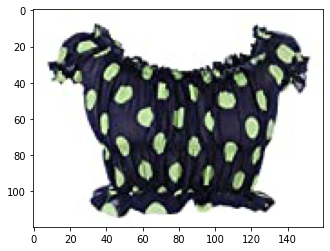

ASIN : B0759G15ZX
Brand: Anna-Kaci
Title: annakaci sm fit blue cord ruffle trim tiered hem drop waist denim blouse 
Euclidean similarity with the query image : 3.3166247903554


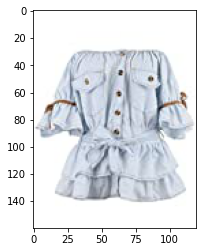

ASIN : B00YQ8S4K0
Brand: Anna-Kaci
Title: anna kaci sm fit blue tiedye white printed bohemian ruffle trim blouse 
Euclidean similarity with the query image : 3.4641016151377544


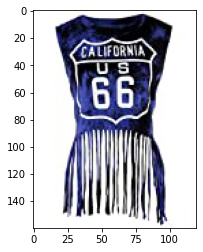

ASIN : B00O194W8W
Brand: Anna-Kaci
Title: annakaci sm fit black scallop pattern crochet lace tiered ruffle trim blouse 
Euclidean similarity with the query image : 3.4641016151377544


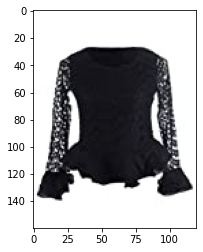

ASIN : B074TLHLMN
Brand: Proenza Schouler
Title: proenza schouler black polka dot blouse 2 
Euclidean similarity with the query image : 3.4641016151377544


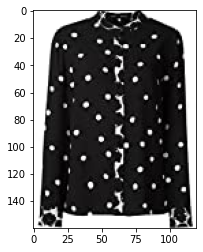

ASIN : B074F5BP5F
Brand: On Twelfth
Title: twelfth womens blouse blue 
Euclidean similarity with the query image : 3.4641016151377544


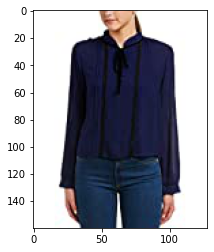

ASIN : B016P80OKQ
Brand: Studio M
Title: studio blue blouse size 
Euclidean similarity with the query image : 3.4641016151377544


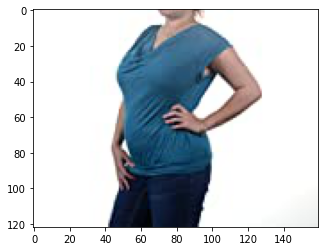

ASIN : B007KSG42S
Brand: Anna-Kaci
Title: annakaci sm fit salmon asianinspired chains pleated ruffle ribbon blouse 
Euclidean similarity with the query image : 3.4641016151377544


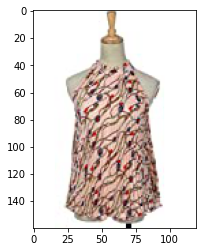

ASIN : B072VHTT1D
Brand: Pleione
Title: pleione womens small scoopneck ruffle trim blouse blue 
Euclidean similarity with the query image : 3.4641016151377544


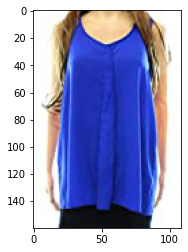

ASIN : B07111HHX6
Brand: Mossimo
Title: mossimo womens tie front blouse white small 
Euclidean similarity with the query image : 3.605551275463989


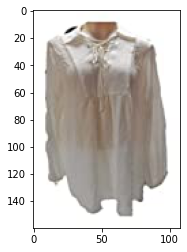

ASIN : B01N3SAT1F
Brand: Ganesh
Title: ganesh womens silkblend blouse 2 blue 
Euclidean similarity with the query image : 3.605551275463989


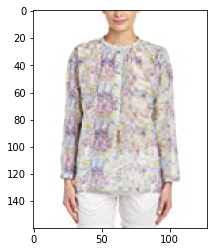

ASIN : B06WW5C6NJ
Brand: Nine West
Title: nine west womens tie front floral print blouse blue l 
Euclidean similarity with the query image : 3.605551275463989


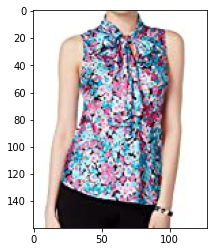

ASIN : B01E1QD5PK
Brand: CHASER
Title: shoulder peasant blouse 
Euclidean similarity with the query image : 3.605551275463989


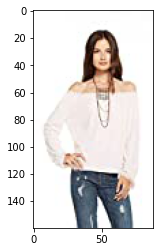

ASIN : B00G5RYY18
Brand: Anna-Kaci
Title: annakaci sm fit star pattern wide sleeve long blouse 
Euclidean similarity with the query image : 3.605551275463989


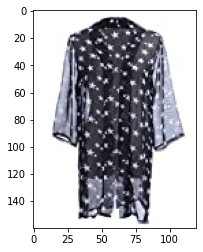

ASIN : B06XCZGQLP
Brand: Velvet by Graham & Spencer
Title: velvet womens lace ruffle trim blouse navy 
Euclidean similarity with the query image : 3.605551275463989


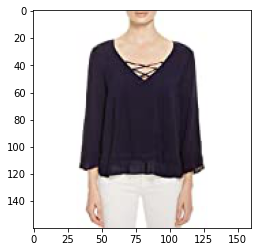

ASIN : B00DW1NKSS
Brand: Anna-Kaci
Title: annakaci sm fit white floral lace trim drawstring tie waist pleat front top 
Euclidean similarity with the query image : 3.605551275463989


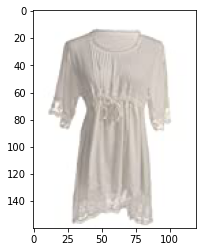

ASIN : B00HCNNOJW
Brand: Anna-Kaci
Title: annakaci sm fit knife pleat neckline ruffle edge poncho style blouse 
Euclidean similarity with the query image : 3.605551275463989


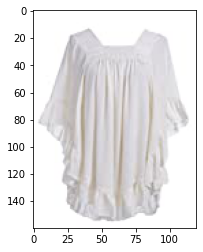

ASIN : B071NDX99J
Brand: CBK
Title: cbk  blouse fanny  women   blue 
Euclidean similarity with the query image : 3.605551275463989


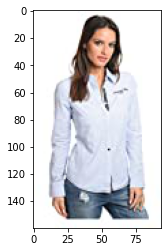

ASIN : B00886YXL0
Brand: Ageless Patterns
Title: 1893 blouse surplice front pattern 
Euclidean similarity with the query image : 3.605551275463989


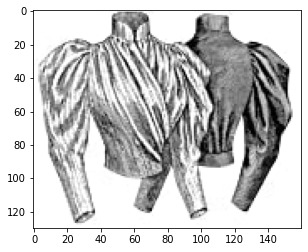

ASIN : B008Z5ST3C
Brand: Anna-Kaci
Title: annakaci sm fit semisheer pink ls chiffon button blouse w polka dots 
Euclidean similarity with the query image : 3.605551275463989


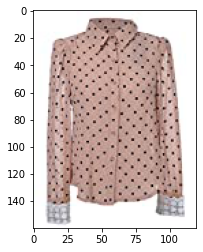

In [25]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    
    for i in range(0,len(indices)):
        a = data['medium_image_url'].loc[df_indices[i]]
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        display_img(a)
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(931, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

# TF-IDF based product similarity

In [5]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

This is our query image......
ASIN : B00KLHUIBS
BRAND : Anna-Kaci
Eucliden distance from the given image : 0.0


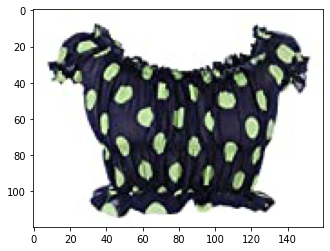

ASIN : B00DW1NKSS
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0095030470167985


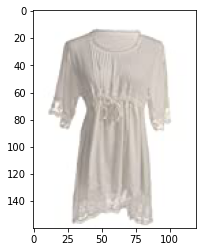

ASIN : B008SMIFN6
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0417985120306879


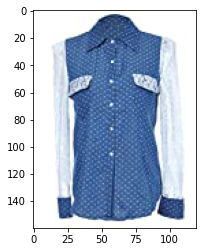

ASIN : B00O194W8W
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0459904789057266


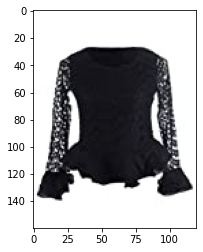

ASIN : B0759G15ZX
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0670382891349646


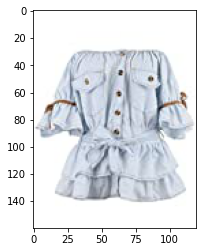

ASIN : B008Z5ST3C
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0791943428312727


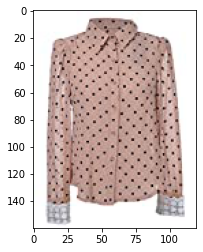

ASIN : B00OIBU11K
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.0810642547494655


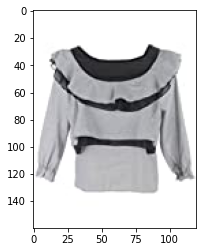

ASIN : B01AYBH28M
BRAND : DSQUARED2
Eucliden distance from the given image : 1.1040520792000037


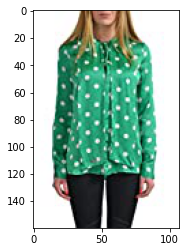

ASIN : B00YQ8S4K0
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1106318669558237


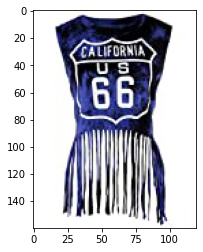

ASIN : B0745J9HNS
BRAND : Almost Famous
Eucliden distance from the given image : 1.1114784382103977


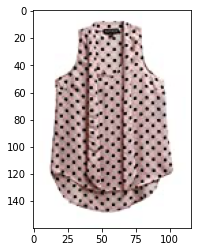

ASIN : B00LMKGFS8
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.113963394862801


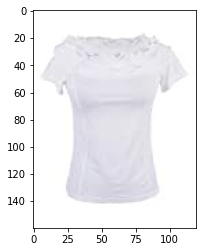

ASIN : B00DVOAWM8
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.115670616192694


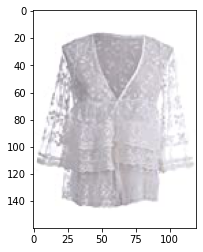

ASIN : B00OPFYBXI
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1246975675554733


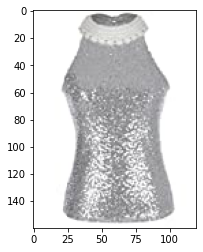

ASIN : B00NAB1R8A
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.124773884923174


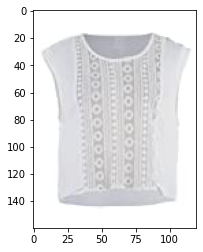

ASIN : B0721KC2HT
BRAND : Studio M
Eucliden distance from the given image : 1.129816389682597


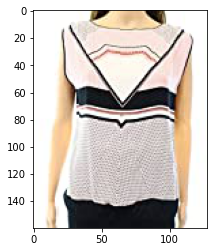

ASIN : B00E7Z8DWQ
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.13146940297404


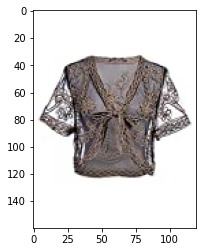

ASIN : B07125NJJ2
BRAND : Alfani
Eucliden distance from the given image : 1.1325545037426967


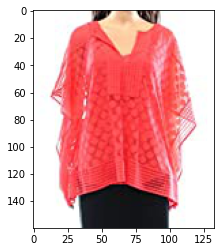

ASIN : B0097LQOOY
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.134493010198643


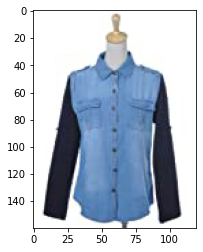

ASIN : B00RDLAR2A
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1394888920467072


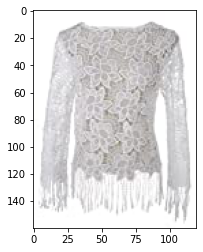

ASIN : B00G5RYY18
BRAND : Anna-Kaci
Eucliden distance from the given image : 1.1474660726278398


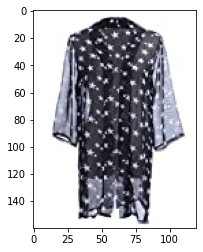

In [7]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        #get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        if pdists[i] == 0.0:
            print('This is our query image......')
            print('ASIN :',data['asin'].loc[df_indices[i]])
            print('BRAND :',data['brand'].loc[df_indices[i]])
            print ('Eucliden distance from the given image :', pdists[i])
            display_img(data['medium_image_url'].loc[df_indices[i]])
        else:
            print('ASIN :',data['asin'].loc[df_indices[i]])
            print('BRAND :',data['brand'].loc[df_indices[i]])
            print ('Eucliden distance from the given image :', pdists[i])
            display_img(data['medium_image_url'].loc[df_indices[i]])
        print('='*125)
tfidf_model(931, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

# IDF based product similarity

In [11]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

In [12]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [13]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
       
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

In [59]:
c = pd.DataFrame(idf_title_features.todense())
c.columns = list((idf_title_vectorizer.vocabulary_))

In [60]:
c

,featherlite,ladies,long,sleeve,stain,resistant,tapered,twill,shirt,2xl,...,sambarbara,b42d,treatment,korea,pia,bows,blousegreen,tailcoat,4937,tiefringe
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16037,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16038,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16039,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16040,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from the given image : 0.0


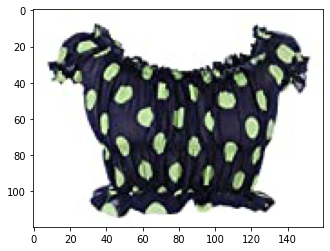

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from the given image : 15.046151721911697


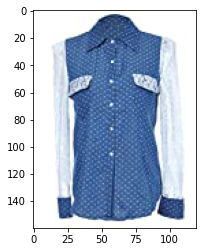

ASIN : B07125NJJ2
Brand : Alfani
euclidean distance from the given image : 15.222769212649535


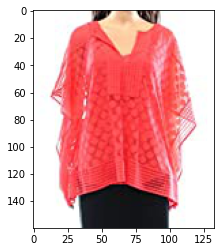

ASIN : B07111HHX6
Brand : Mossimo
euclidean distance from the given image : 15.3415518161122


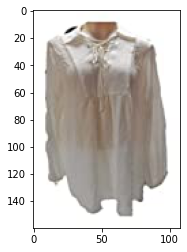

ASIN : B0721KC2HT
Brand : Studio M
euclidean distance from the given image : 15.627349276848992


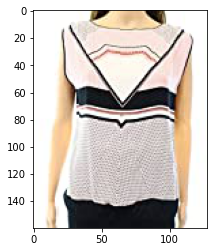

ASIN : B01KXEE20Q
Brand : ouwoow
euclidean distance from the given image : 15.685249209812426


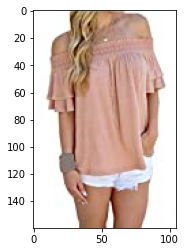

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 15.698624105009333


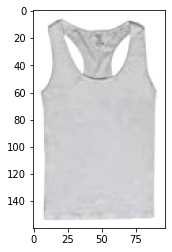

ASIN : B072VHTT1D
Brand : Pleione
euclidean distance from the given image : 15.733159164541727


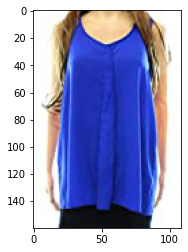

ASIN : B0722TS9DK
Brand : Who What Wear
euclidean distance from the given image : 15.746519642051068


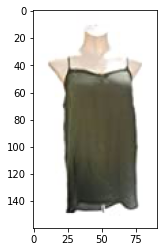

ASIN : B07258X2FK
Brand : Who What Wear
euclidean distance from the given image : 15.76861658770721


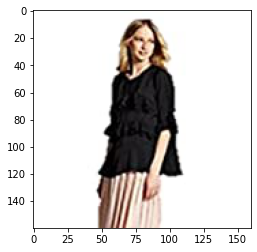

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 15.769570727563098


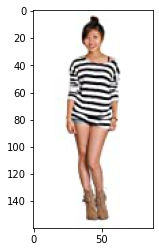

ASIN : B073GJGVBN
Brand : Ivan Levi
euclidean distance from the given image : 15.811562821616887


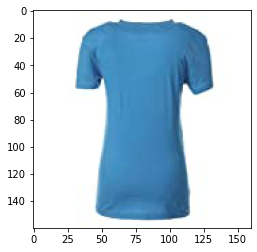

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 15.83828054738109


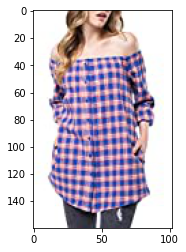

ASIN : B06XCZGQLP
Brand : Velvet by Graham & Spencer
euclidean distance from the given image : 15.878781785172018


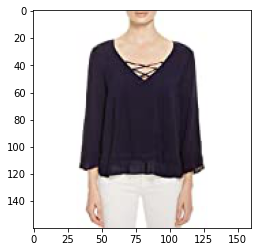

ASIN : B075831F14
Brand : Very J
euclidean distance from the given image : 15.928749759426031


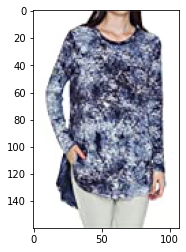

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 15.953279501032116


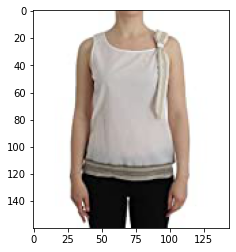

ASIN : B016P80OKQ
Brand : Studio M
euclidean distance from the given image : 16.078823245515473


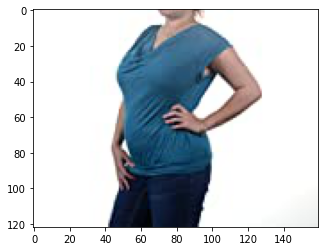

ASIN : B0097LQOOY
Brand : Anna-Kaci
euclidean distance from the given image : 16.11978163937991


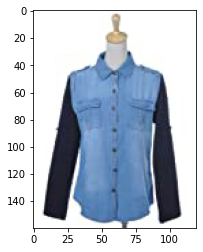

ASIN : B071RYB16J
Brand : Who What Wear
euclidean distance from the given image : 16.18992757930191


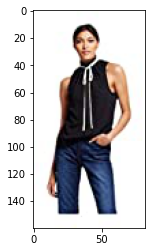

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 16.20255923081081


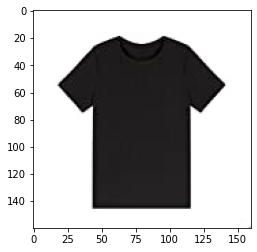

In [12]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        #get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        display_img(data['medium_image_url'].loc[df_indices[i]])
        print('='*125)

        
        
idf_model(931,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# Average Word2Vec product similarity.

In [8]:
#if you do NOT have RAM >= 12GB, use the code below.
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [9]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

In [25]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


ASIN : B00KLHUIBS
BRAND : Anna-Kaci
euclidean distance from given input image : 0.0


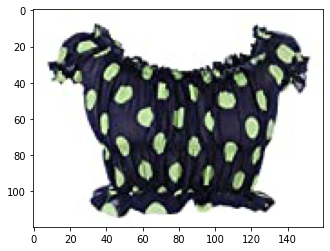

ASIN : B00YQ8S4K0
BRAND : Anna-Kaci
euclidean distance from given input image : 0.66906893


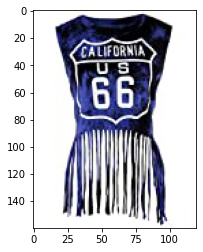

ASIN : B072VHTT1D
BRAND : Pleione
euclidean distance from given input image : 0.7917671


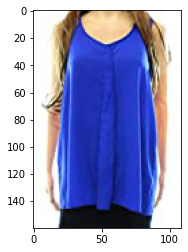

ASIN : B00LMKGFS8
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8094231


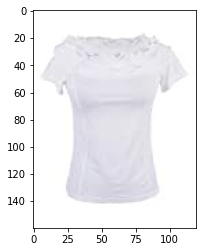

ASIN : B01AYBH28M
BRAND : DSQUARED2
euclidean distance from given input image : 0.81274205


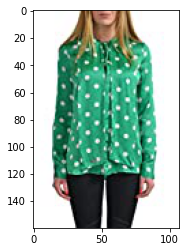

ASIN : B010EH3S02
BRAND : Anna-Kaci
euclidean distance from given input image : 0.81881666


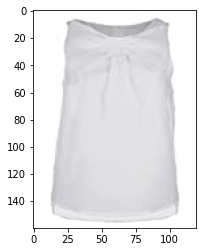

ASIN : B00LU4Z2YY
BRAND : Anna-Kaci
euclidean distance from given input image : 0.81900114


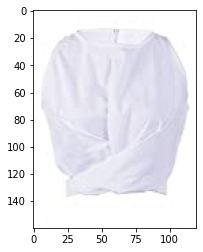

ASIN : B074PFR9CF
BRAND : Nili Lotan
euclidean distance from given input image : 0.8217533


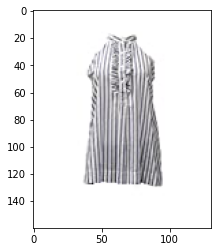

ASIN : B0759G15ZX
BRAND : Anna-Kaci
euclidean distance from given input image : 0.82678145


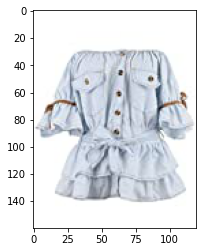

ASIN : B00KOBQEBO
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8268438


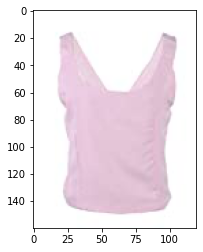

ASIN : B00HM9OD8W
BRAND : Anna-Kaci
euclidean distance from given input image : 0.82737076


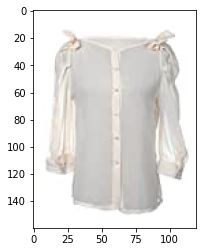

ASIN : B00E7Z8DWQ
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8279004


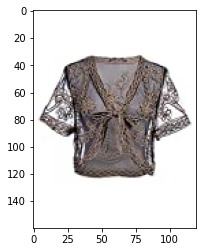

ASIN : B074JKJHNQ
BRAND : VS Pink
euclidean distance from given input image : 0.8330928


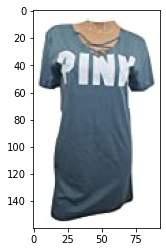

ASIN : B01M19NC0Y
BRAND : POGT
euclidean distance from given input image : 0.8357964


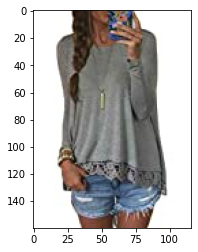

ASIN : B019820A4Q
BRAND : Anna-Kaci
euclidean distance from given input image : 0.84296256


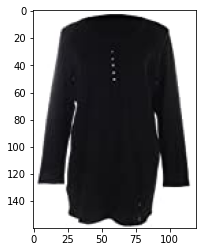

ASIN : B007Y9SZSY
BRAND : Anna-Kaci
euclidean distance from given input image : 0.84324485


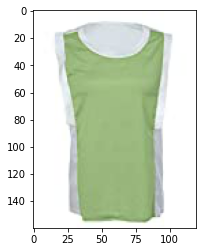

ASIN : B01D6FVFH2
BRAND : DSQUARED2
euclidean distance from given input image : 0.8452495


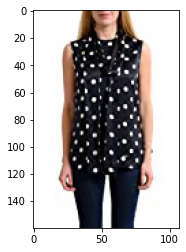

ASIN : B008LE9GA2
BRAND : Anna-Kaci
euclidean distance from given input image : 0.84813696


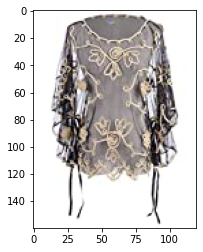

ASIN : B01JCZWOUW
BRAND : No Boundaries
euclidean distance from given input image : 0.8488442


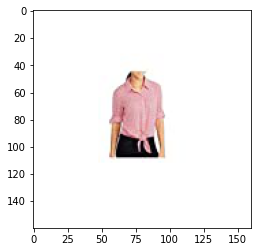

ASIN : B00O194W8W
BRAND : Anna-Kaci
euclidean distance from given input image : 0.8498151


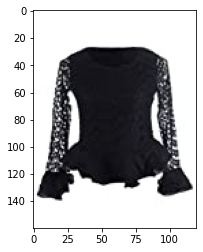

In [31]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        #heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        display_img(data['medium_image_url'].loc[df_indices[i]])
        print('='*125)

        
avg_w2v_model(931, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

# IDF weighted Word2Vec for product similarity

In [14]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

ASIN : B00KLHUIBS
Brand : Anna-Kaci
euclidean distance from input : 0.0


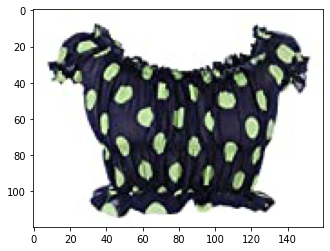

ASIN : B072VHTT1D
Brand : Pleione
euclidean distance from input : 3.3046243


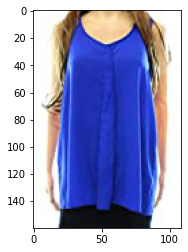

ASIN : B01AYBH28M
Brand : DSQUARED2
euclidean distance from input : 3.3703346


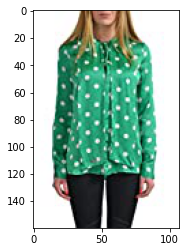

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
euclidean distance from input : 3.4193525


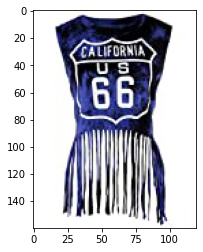

ASIN : B00ZD1LI16
Brand : bankhunyabangyai store
euclidean distance from input : 3.4255989


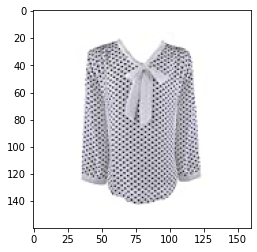

ASIN : B07125NJJ2
Brand : Alfani
euclidean distance from input : 3.4406197


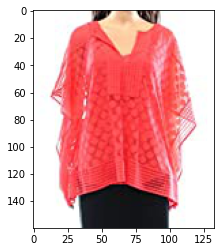

ASIN : B074PFR9CF
Brand : Nili Lotan
euclidean distance from input : 3.5470216


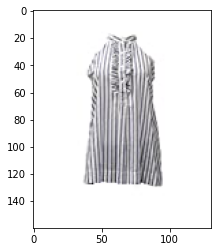

ASIN : B0725BZ69R
Brand : Greylin
euclidean distance from input : 3.570146


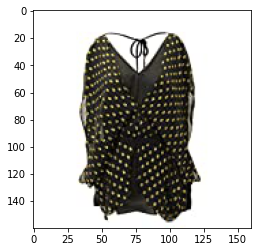

ASIN : B071XHZ2N2
Brand : Elodie
euclidean distance from input : 3.6468346


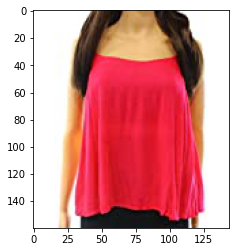

ASIN : B014JS4NIS
Brand : Ultra Flirt
euclidean distance from input : 3.6527064


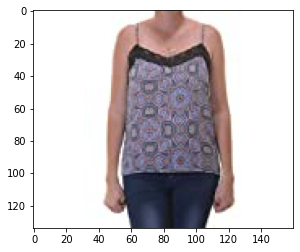

ASIN : B01JCZWOUW
Brand : No Boundaries
euclidean distance from input : 3.6577132


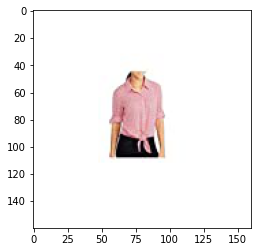

ASIN : B008SMIFN6
Brand : Anna-Kaci
euclidean distance from input : 3.6822648


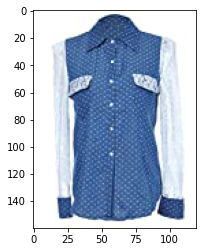

ASIN : B0745J9HNS
Brand : Almost Famous
euclidean distance from input : 3.7160883


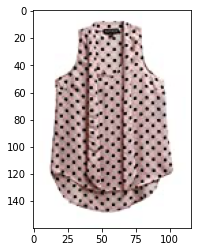

ASIN : B074TLHLMN
Brand : Proenza Schouler
euclidean distance from input : 3.721807


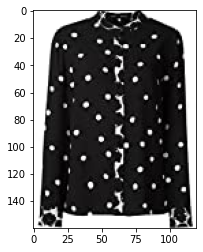

ASIN : B0721KC2HT
Brand : Studio M
euclidean distance from input : 3.7407618


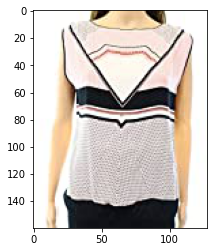

ASIN : B0731KJL5J
Brand : gagaopt
euclidean distance from input : 3.7530394


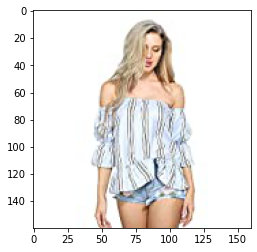

ASIN : B01APYN5AM
Brand : DSQUARED2
euclidean distance from input : 3.770843


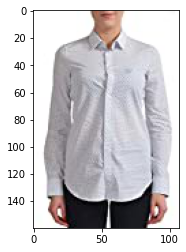

ASIN : B01M19NC0Y
Brand : POGT
euclidean distance from input : 3.7775102


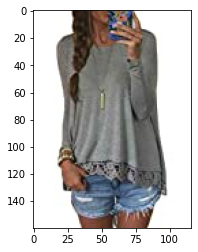

ASIN : B06XD3ZTCB
Brand : Elodie
euclidean distance from input : 3.7784634


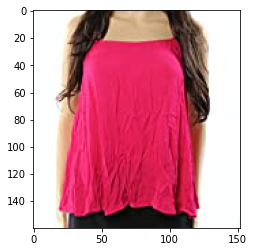

ASIN : B074QW18HZ
Brand : Santorelli
euclidean distance from input : 3.7946742


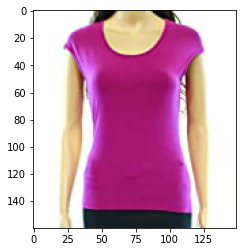

In [33]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        #heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        display_img(data['medium_image_url'].loc[df_indices[i]])
        print('='*125)

weighted_w2v_model(931, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

# Weighted similarity using brand and color

In [4]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

ASIN : B00KLHUIBS
Brand : Anna-Kaci
color : Blue/Green
euclidean distance from input : 0.0


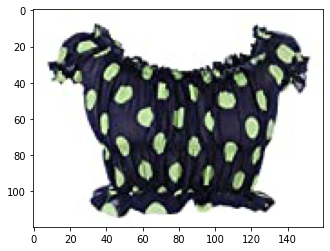

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 2.8145143508911135


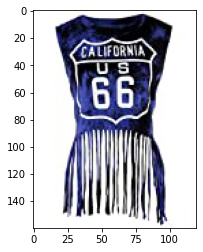

ASIN : B072VHTT1D
Brand : Pleione
color : Blue
euclidean distance from input : 2.978468322753906


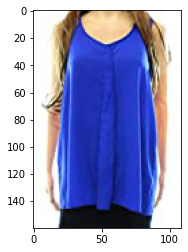

ASIN : B008SMIFN6
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 3.011698532104492


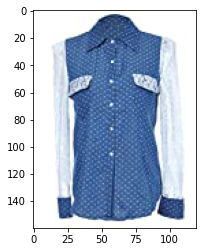

ASIN : B07125NJJ2
Brand : Alfani
color : Pink
euclidean distance from input : 3.1928371802636653


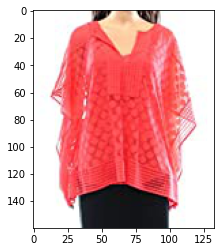

ASIN : B00ZD1LI16
Brand : bankhunyabangyai store
color : White
euclidean distance from input : 3.2306370083691744


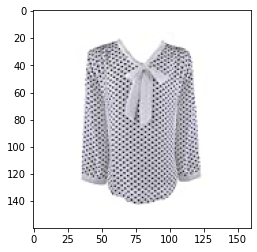

ASIN : B074PFR9CF
Brand : Nili Lotan
color : Blue/White
euclidean distance from input : 3.2726387397119074


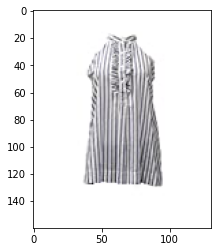

ASIN : B01AYBH28M
Brand : DSQUARED2
color : Multi-color
euclidean distance from input : 3.2777509689331055


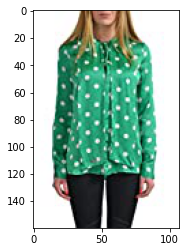

ASIN : B0097LQOOY
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 3.2852563858032227


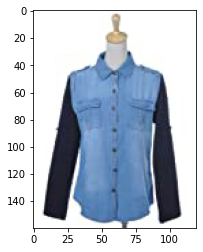

ASIN : B019XS6OLS
Brand : Anna-Kaci
color : Red
euclidean distance from input : 3.285337187671028


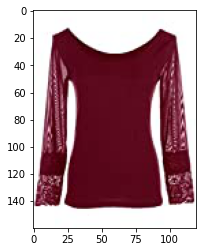

ASIN : B0731KJL5J
Brand : gagaopt
color : Blue
euclidean distance from input : 3.3147794723510744


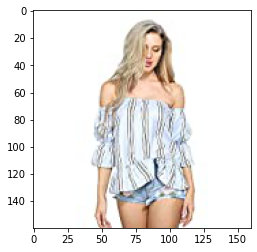

ASIN : B0725BZ69R
Brand : Greylin
color : Black/Gold
euclidean distance from input : 3.3390474621655613


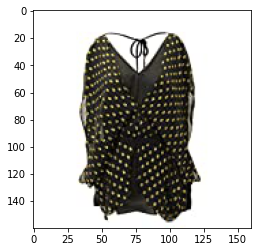

ASIN : B071XHZ2N2
Brand : Elodie
color : Pink
euclidean distance from input : 3.3474983588525324


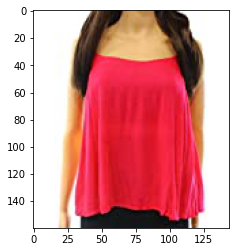

ASIN : B010EH3S02
Brand : Anna-Kaci
color : White
euclidean distance from input : 3.3556021946900705


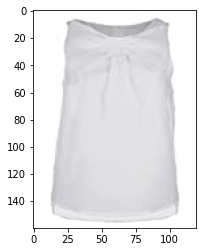

ASIN : B019NQLRF8
Brand : Anna-Kaci
color : Red
euclidean distance from input : 3.405888678454719


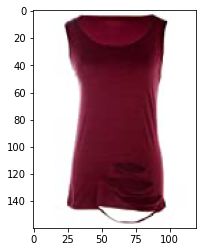

ASIN : B0721KC2HT
Brand : Studio M
color : Pink
euclidean distance from input : 3.41794380105224


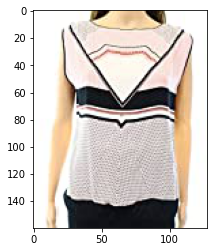

ASIN : B019820A4Q
Brand : Anna-Kaci
color : Black
euclidean distance from input : 3.443790175341926


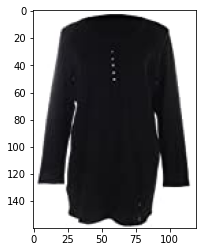

ASIN : B06XD3ZTCB
Brand : Elodie
color : Pink
euclidean distance from input : 3.446219863063958


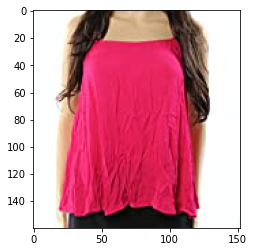

ASIN : B01JCZWOUW
Brand : No Boundaries
color : Pink Dot
euclidean distance from input : 3.4503915788550046


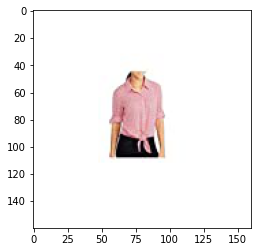

ASIN : B00NAEMMW2
Brand : Anna-Kaci
color : Grey
euclidean distance from input : 3.454260184192024


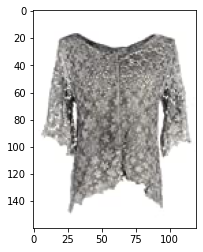

In [46]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        #heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('color :',data['color'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        display_img(data['medium_image_url'].loc[df_indices[i]])
        print('='*125)

idf_w2v_brand(931, 15, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

ASIN : B00KLHUIBS
Brand : Anna-Kaci
color : Blue/Green
euclidean distance from input : 0.0


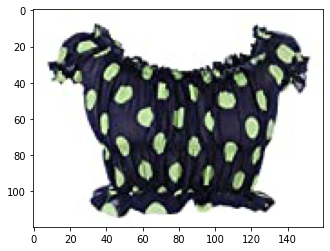

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 1.6048381805419922


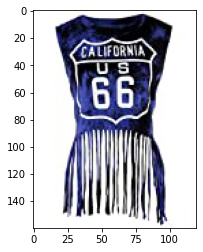

ASIN : B008SMIFN6
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 1.6705661773681642


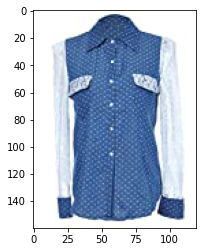

ASIN : B0097LQOOY
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 1.7617521286010742


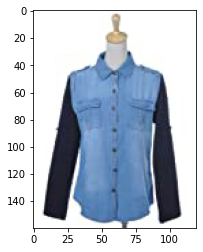

ASIN : B00726I25U
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 1.8391237258911133


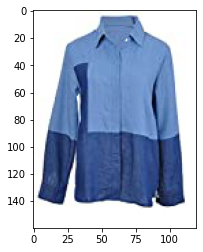

ASIN : B0128Z19IQ
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 1.9386258125305176


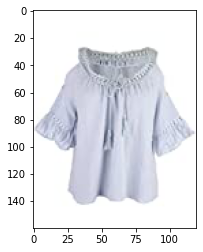

ASIN : B010EH1PCK
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 1.96404972076416


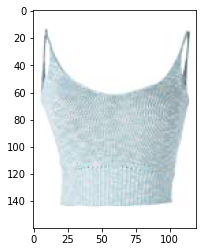

ASIN : B0128Z1BNO
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 2.0017333984375


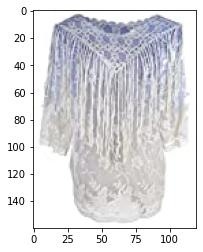

ASIN : B010EH2WCW
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 2.00500602722168


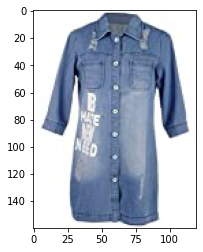

ASIN : B00E7Z8G8M
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 2.1679643630981444


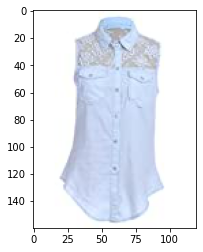

ASIN : B019XS6OLS
Brand : Anna-Kaci
color : Red
euclidean distance from input : 2.2498129660587383


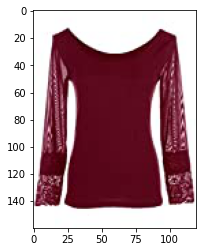

ASIN : B010EH3S02
Brand : Anna-Kaci
color : White
euclidean distance from input : 2.273234635065086


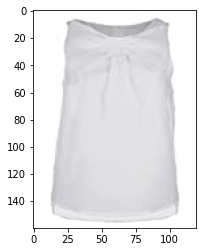

ASIN : B019NQLRF8
Brand : Anna-Kaci
color : Red
euclidean distance from input : 2.2899967963199686


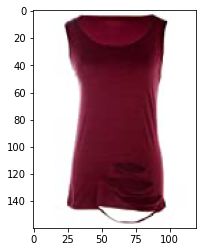

ASIN : B019820A4Q
Brand : Anna-Kaci
color : Black
euclidean distance from input : 2.3026305968265603


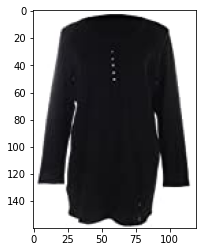

ASIN : B00NAEMMW2
Brand : Anna-Kaci
color : Grey
euclidean distance from input : 2.306120567987449


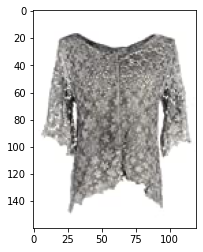

ASIN : B008Z5ST3C
Brand : Anna-Kaci
color : Pink
euclidean distance from input : 2.311931400964744


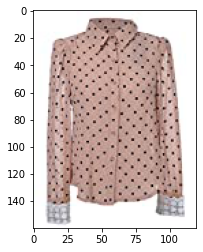

ASIN : B011WFBMBC
Brand : Anna-Kaci
color : White
euclidean distance from input : 2.3255551154117655


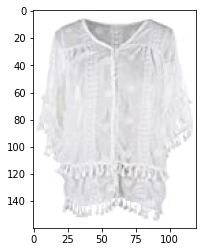

ASIN : B072VHTT1D
Brand : Pleione
color : Blue
euclidean distance from input : 2.3261560440063476


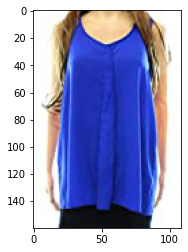

ASIN : B007HCB8XM
Brand : Anna-Kaci
color : White
euclidean distance from input : 2.3276136214237284


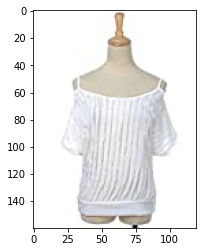

ASIN : B00KOBQEBO
Brand : Anna-Kaci
color : Pink
euclidean distance from input : 2.3360494429569316


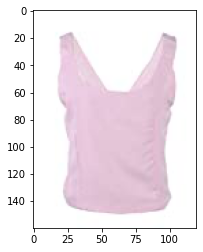

In [47]:
idf_w2v_brand(931, 5, 15, 20)

# Image base features

### Using Keras and Tensorflow to extract features

In [20]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

In [ ]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html



# This code takes 40 minutes to run on a modern GPU (graphics card) 
# like Nvidia  1050.
# GPU (NVidia 1050): 0.175 seconds per image

# This codse takes 160 minutes to run on a high end i7 CPU
# CPU (i7): 0.615 seconds per image.

#Do NOT run this code unless you want to wait a few hours for it to generate output

# each image is converted into 25088 length dense-vector


'''
# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    

save_bottlebeck_features()

'''

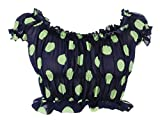

Product Title:  annakaci sm fit blue green polka dot tie front ruffle trim blouse 
Euclidean Distance from input image: 6.468134e-06
Amazon Url: www.amzon.com/dp/B00KLHUIBS


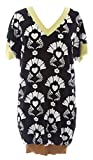

Product Title:  eternal child womens black floral printed vneck short sleeve tunic sz new 
Euclidean Distance from input image: 47.391518
Amazon Url: www.amzon.com/dp/B0184RPZNM


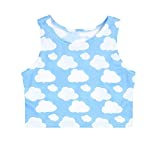

Product Title:  harajuku cloud printed elastic crop tops women 
Euclidean Distance from input image: 48.21552
Amazon Url: www.amzon.com/dp/B01KQHFVP0


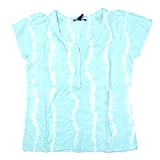

Product Title:  bandolino womens erin round v neck tie dyed shirt top small aqua refelction 
Euclidean Distance from input image: 48.509647
Amazon Url: www.amzon.com/dp/B00ROB8A8W


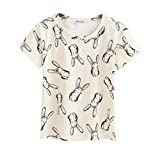

Product Title:  new kawaii cotton pastel tops tees rabbit design 
Euclidean Distance from input image: 48.602116
Amazon Url: www.amzon.com/dp/B074S5F9ZK


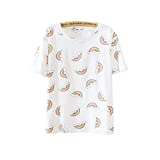

Product Title:  cute womens tops tees pastel rainbow print size 
Euclidean Distance from input image: 48.69884
Amazon Url: www.amzon.com/dp/B01415UNVU


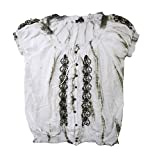

Product Title:  fever ladies size small rayon blouse white  green 
Euclidean Distance from input image: 48.728474
Amazon Url: www.amzon.com/dp/B0731PMQZ2


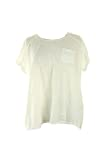

Product Title:  style  co plus size new whit cuffed shortsleeve tee 2x 1498 dbfl 
Euclidean Distance from input image: 48.86433
Amazon Url: www.amzon.com/dp/B0178WOJVS


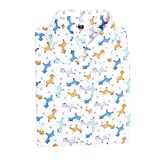

Product Title:  women blouses turn collar floral tops lady long sleeve shirt sxxxxl 
Euclidean Distance from input image: 48.97316
Amazon Url: www.amzon.com/dp/B07552VG9B


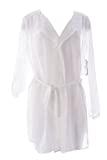

Product Title:  miraclebody miraclesuit womens roll sleeve long tunic sz medium ivory 
Euclidean Distance from input image: 49.00902
Amazon Url: www.amzon.com/dp/B01MUF826N


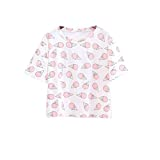

Product Title:  womens kawaii cotton pastel tops tees pink ice cream design 
Euclidean Distance from input image: 49.05505
Amazon Url: www.amzon.com/dp/B06XG3LBFC


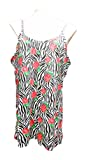

Product Title:  op juniors plus scoop neck tank 2x 1921 zebrarose 
Euclidean Distance from input image: 49.129025
Amazon Url: www.amzon.com/dp/B06Y6KNDBG


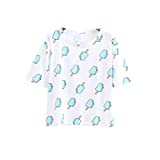

Product Title:  womens kawaii cotton pastel tops tees ice cream pop design 
Euclidean Distance from input image: 49.15118
Amazon Url: www.amzon.com/dp/B06XG1Q7SD


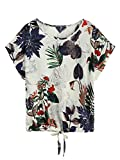

Product Title:  floerns womens tropical print drawstring hem tshirt onesize multicolor 
Euclidean Distance from input image: 49.156002
Amazon Url: www.amzon.com/dp/B06VW9CZ8Y


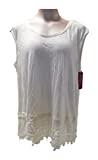

Product Title:  merona womens blouse shell xxl 
Euclidean Distance from input image: 49.20418
Amazon Url: www.amzon.com/dp/B06ZYH5VXR


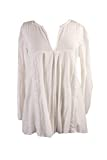

Product Title:  denim supply white lacetrim cotton swing tunic 
Euclidean Distance from input image: 49.21299
Amazon Url: www.amzon.com/dp/B06XFNJXS7


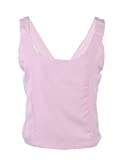

Product Title:  annakaci sm fit pink bow ribbon back trim racer detail shell style top 
Euclidean Distance from input image: 49.216335
Amazon Url: www.amzon.com/dp/B00KOBQEBO


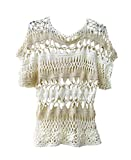

Product Title:  tinacrochetstudio crochet summer tops designer blouse short sleeve jumpsuits 
Euclidean Distance from input image: 49.22291
Amazon Url: www.amzon.com/dp/B016YGD3TI


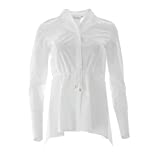

Product Title:  max mara womens curve tie waist button shirt sz 2 white 
Euclidean Distance from input image: 49.23991
Amazon Url: www.amzon.com/dp/B06WWJQ3P2


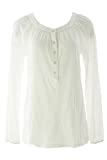

Product Title:  velvet graham  spencer womens buttondown cotton top small winter white 
Euclidean Distance from input image: 49.280148
Amazon Url: www.amzon.com/dp/B01MQJ2NV8


In [23]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('pickels/16k_data_cnn_features.npy')
asins = np.load('pickels/16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(931, 20)


# weighted simlarity using color brand and image feature

ASIN : B00KLHUIBS
Brand : Anna-Kaci
color : Blue/Green
euclidean distance from input : 1.3757939556061531e-07


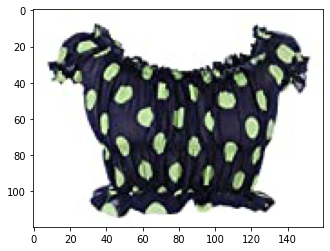

ASIN : B00YQ8S4K0
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 3.491248838363155


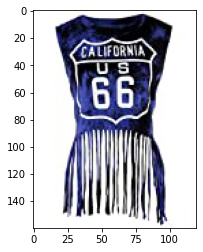

ASIN : B01J65ZE2I
Brand : Flying Cross
color : Blue
euclidean distance from input : 3.5758954940303678


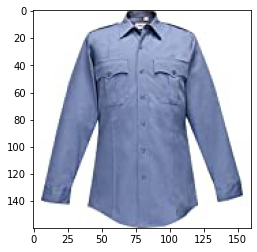

ASIN : B072VHTT1D
Brand : Pleione
color : Blue
euclidean distance from input : 3.6148492917087527


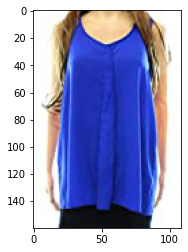

ASIN : B008SMIFN6
Brand : Anna-Kaci
color : Blue
euclidean distance from input : 3.640762698265814


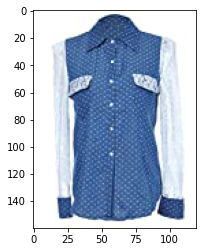

ASIN : B01ND46TFT
Brand : Zoe Karssen
color : Blue
euclidean distance from input : 3.6749393093970513


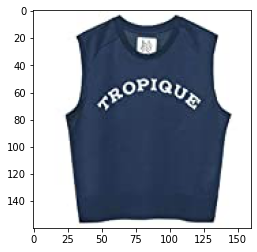

ASIN : B009AF4K66
Brand : Lizwear
color : Green & Blue
euclidean distance from input : 3.693040987383526


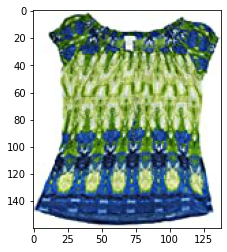

ASIN : B071FQX7CZ
Brand : Bobeau
color : Green
euclidean distance from input : 3.71695427857635


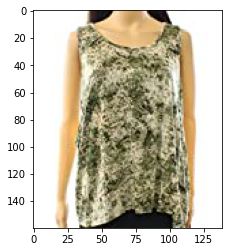

ASIN : B074P85Y4R
Brand : Dantelle
color : Blue
euclidean distance from input : 3.7290300719349374


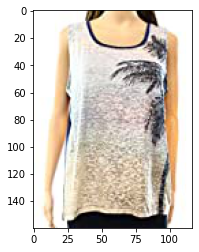

ASIN : B06XV6VFVC
Brand : Focal20
color : Blue
euclidean distance from input : 3.7320158108737918


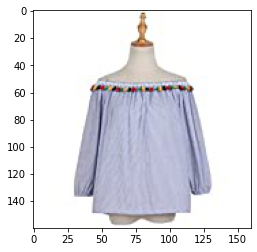

ASIN : B073V44QB8
Brand : a_line
color : Blue
euclidean distance from input : 3.752130648028057


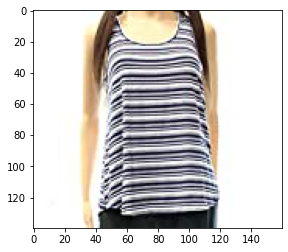

ASIN : B01L6U9CF6
Brand : Misaky women top
color : Blue
euclidean distance from input : 3.7718113338677837


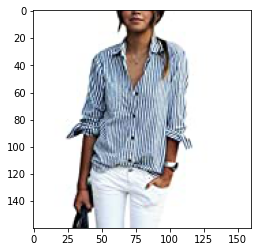

ASIN : B06XY2X2CB
Brand : Collective Concepts
color : Blue
euclidean distance from input : 3.775447230185232


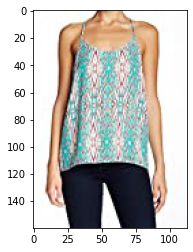

ASIN : B01EV1NKNW
Brand : Creazy
color : Black
euclidean distance from input : 3.776622637286037


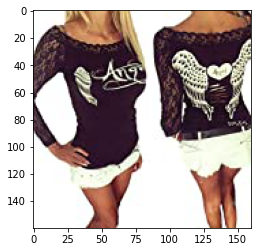

ASIN : B01JIUCV40
Brand : Yepme
color : Green
euclidean distance from input : 3.7802629943966624


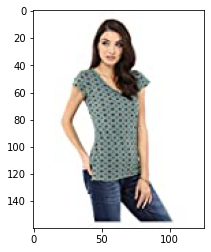

ASIN : B014JS4NIS
Brand : Ultra Flirt
color : Multi-color
euclidean distance from input : 3.7960601314421623


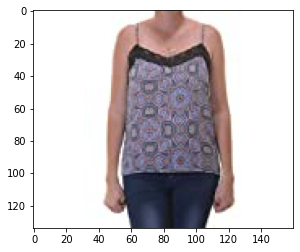

ASIN : B074GT5WX4
Brand : Nanon
color : Blue
euclidean distance from input : 3.806178632489688


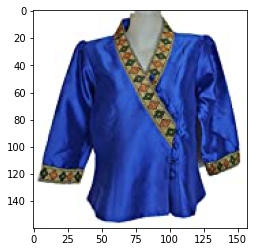

ASIN : B0722DJVQP
Brand : Kasper
color : Blue
euclidean distance from input : 3.822035344584887


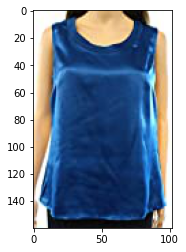

ASIN : B072WQ86QJ
Brand : FEIANNA
color : White Black Stripe
euclidean distance from input : 3.826435725726925


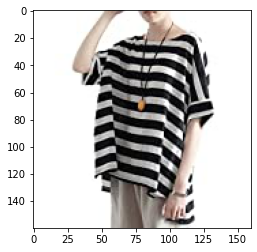

ASIN : B074TH83H1
Brand : BCBGMAXAZRIA
color : Bare Pink
euclidean distance from input : 3.8278875824093577


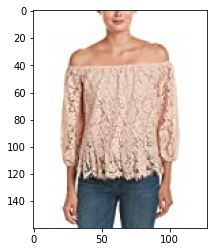

In [51]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist  = pairwise_distances(brand_features, brand_features[doc_id])
    ex_feat_dist1 = pairwise_distances(color_features, color_features[doc_id])
    ex_feat_dist2 = pairwise_distances(bottleneck_features_train , bottleneck_features_train[doc_id].reshape(1, -1))
    pairwise_dist = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3*ex_feat_dist1 + w4*ex_feat_dist2)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        #heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('color :',data['color'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        #print(data['medium_image_url'].loc[df_indices[i]])
        display_img(data['medium_image_url'].loc[df_indices[i]])
        print('='*125)

idf_w2v_brand(931, 15, 5, 10, 1, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

<B>here we give a more weight on the title and color feature so our model is try to find a
minimum distance to given title and color and which product is min euc-dist they predict
similar product to title and color.

ASIN : B00KLHUIBS
Brand : Anna-Kaci
color : Blue/Green
euclidean distance from input : 5.331201464287006e-07


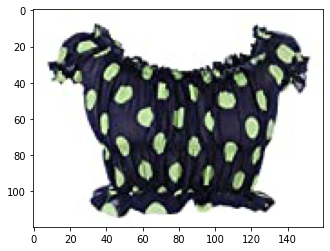

ASIN : B01D9B49LW
Brand : Sugar Lips
color : 2PACK: NUDE/WHITE
euclidean distance from input : 5.6175538081615946


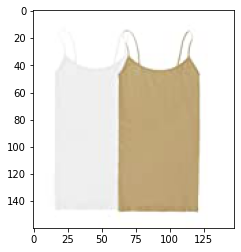

ASIN : B072WQ86QJ
Brand : FEIANNA
color : White Black Stripe
euclidean distance from input : 5.738741676612717


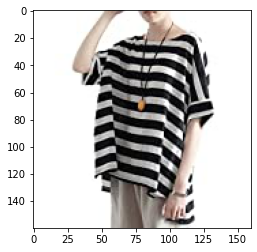

ASIN : B072HCVT7P
Brand : BODEN
color : Multi
euclidean distance from input : 5.780578473852797


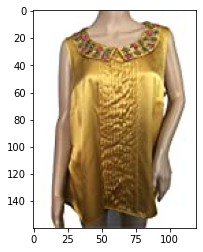

ASIN : B074TH83H1
Brand : BCBGMAXAZRIA
color : Bare Pink
euclidean distance from input : 5.820536222790722


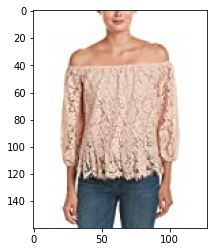

ASIN : B01D7T4BIC
Brand : Alice & Trixie
color : Black
euclidean distance from input : 5.8541902193543125


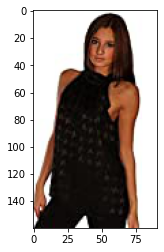

ASIN : B01J65ZE2I
Brand : Flying Cross
color : Blue
euclidean distance from input : 5.867612361907959


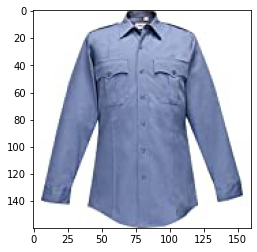

ASIN : B00Y8C6XEI
Brand : kensie
color : Blue Multi
euclidean distance from input : 5.9789351371730515


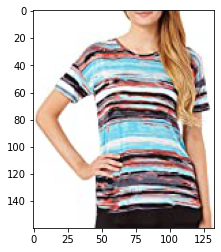

ASIN : B01EV1NKNW
Brand : Creazy
color : Black
euclidean distance from input : 5.985260537909194


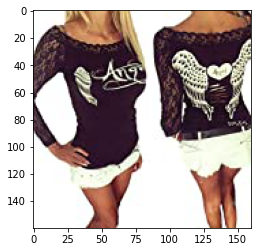

ASIN : B07486NTYQ
Brand : Aeneontrue
color : Dark Blue
euclidean distance from input : 5.9866763023341845


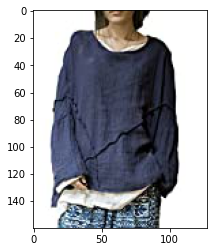

ASIN : B01LDW11EC
Brand : curvyluv.com
color : Black
euclidean distance from input : 6.0001161226746245


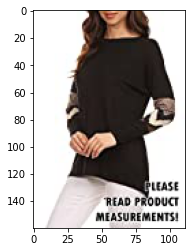

ASIN : B074P85Y4R
Brand : Dantelle
color : Blue
euclidean distance from input : 6.005594339703563


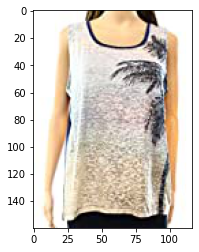

ASIN : B01D3VEIOG
Brand : DSQUARED2
color : Purple
euclidean distance from input : 6.022076658056899


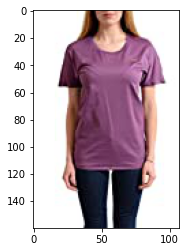

ASIN : B07229JP6M
Brand : MSK
color : Purple
euclidean distance from input : 6.05315232639186


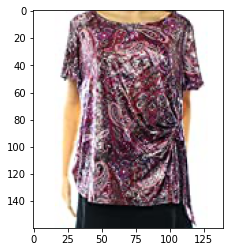

ASIN : B01MSA3SB8
Brand : Victoria's Secret
color : Green
euclidean distance from input : 6.063395690917969


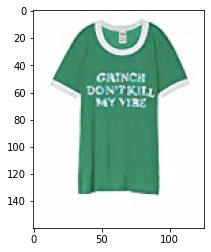

ASIN : B01NCV1TKU
Brand : WIIPU
color : Silver
euclidean distance from input : 6.064303830908462


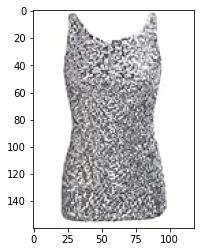

ASIN : B01M0EYVOG
Brand : Studio M
color : Black/White
euclidean distance from input : 6.066258135174754


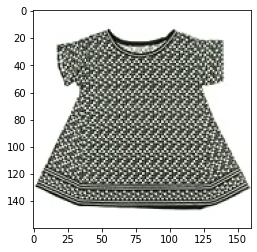

ASIN : B01MSYDNG5
Brand : Grace Elements
color : Coral Kiss
euclidean distance from input : 6.068778610229492


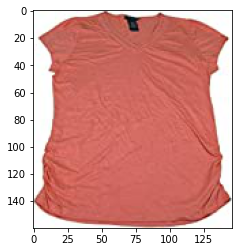

ASIN : B073XRDRN7
Brand : Fylo
color : Black
euclidean distance from input : 6.072287610815688


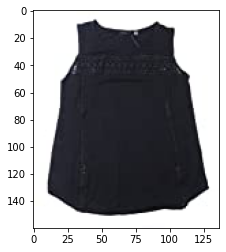

ASIN : B06Y4FHFWY
Brand : Umgee
color : Grey
euclidean distance from input : 6.085712102698013


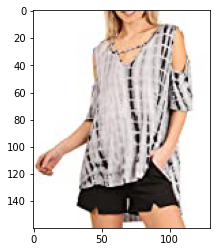

In [44]:
idf_w2v_brand(931, 15, 15, 5,5, 20)

<B> here we give a more a weight on title and brand so our model try to predict a similar
product where a title and a brand a almost same.

ASIN : B00KLHUIBS
Brand : Anna-Kaci
color : Blue/Green
euclidean distance from input : 1.8955382984131574e-06


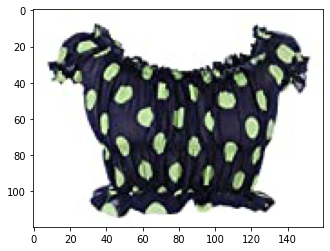

ASIN : B01D9B49LW
Brand : Sugar Lips
color : 2PACK: NUDE/WHITE
euclidean distance from input : 10.998365703871459


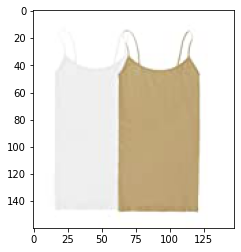

ASIN : B01LY1Z8IY
Brand : AriZona
color : Multi-color
euclidean distance from input : 12.016455555767202


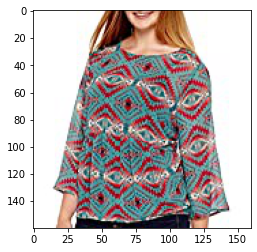

ASIN : B074MGFYFC
Brand : Isla
color : Pale Blue
euclidean distance from input : 12.380679544738571


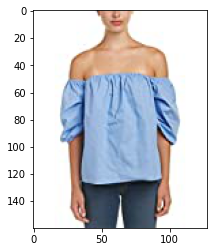

ASIN : B00Y9HREL8
Brand : Ai.Moichien
color : Black
euclidean distance from input : 12.508598531383093


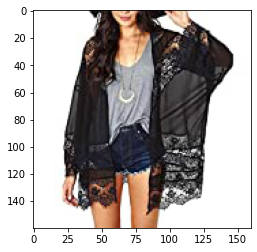

ASIN : B01CT4G42M
Brand : Rebel Yell
color : Royal
euclidean distance from input : 12.514070375526432


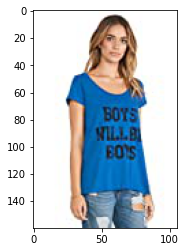

ASIN : B01MSA3SB8
Brand : Victoria's Secret
color : Green
euclidean distance from input : 12.664176347520616


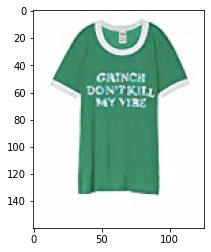

ASIN : B072HCVT7P
Brand : BODEN
color : Multi
euclidean distance from input : 12.697821599153876


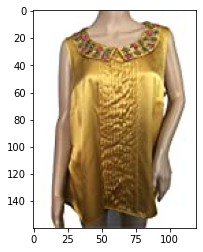

ASIN : B074XG4RZJ
Brand : Jess & Jane
color : Eternity
euclidean distance from input : 12.702783025401649


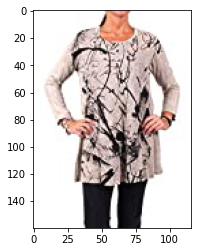

ASIN : B01D7T4BIC
Brand : Alice & Trixie
color : Black
euclidean distance from input : 12.763544879785329


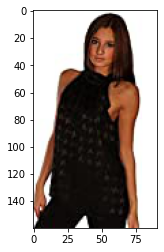

ASIN : B01MSYDNG5
Brand : Grace Elements
color : Coral Kiss
euclidean distance from input : 12.820509423149957


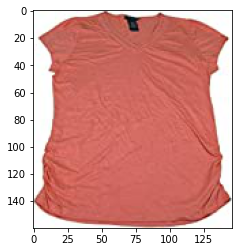

ASIN : B01KEQ5IGA
Brand : BCX
color : Coral
euclidean distance from input : 12.909606385802098


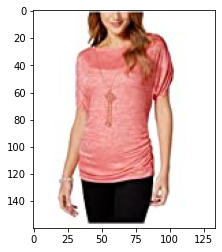

ASIN : B01LZ4IC3A
Brand : Wolford
color : Black
euclidean distance from input : 12.982683693609172


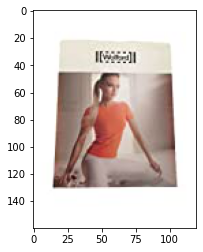

ASIN : B072WQ86QJ
Brand : FEIANNA
color : White Black Stripe
euclidean distance from input : 13.035961125090049


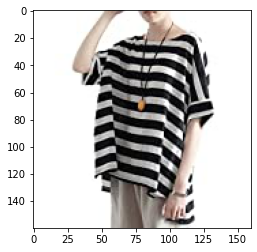

ASIN : B07486NTYQ
Brand : Aeneontrue
color : Dark Blue
euclidean distance from input : 13.03834030455845


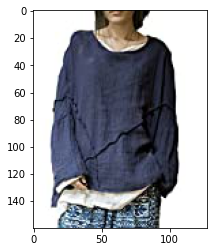

ASIN : B01J65ZE2I
Brand : Flying Cross
color : Blue
euclidean distance from input : 13.121598731146918


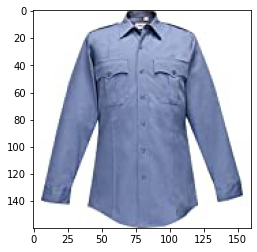

ASIN : B01N2OSO76
Brand : Hunter Bell
color : Teal
euclidean distance from input : 13.147343012787717


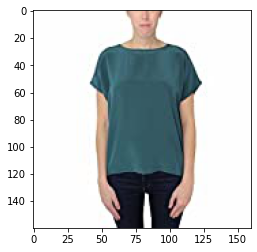

ASIN : B00Y8C6XEI
Brand : kensie
color : Blue Multi
euclidean distance from input : 13.156338003872143


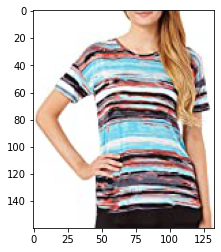

ASIN : B0142LT93Q
Brand : H'nan
color : DeepHeather
euclidean distance from input : 13.160037616135213


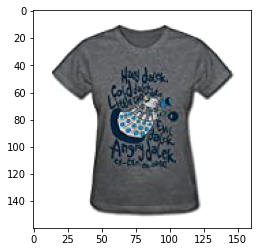

ASIN : B074TH83H1
Brand : BCBGMAXAZRIA
color : Bare Pink
euclidean distance from input : 13.198683728917159


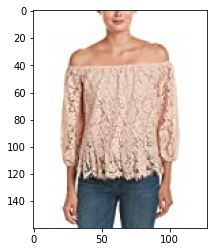

In [52]:
idf_w2v_brand(931, 5, 5, 15,20, 20)

<B>here we give a more weight on the color and the image so our model try to find a similar
product where a immage or color is a same.

ASIN : B00KLHUIBS
Brand : Anna-Kaci
color : Blue/Green
euclidean distance from input : 1.0662403155947686e-06


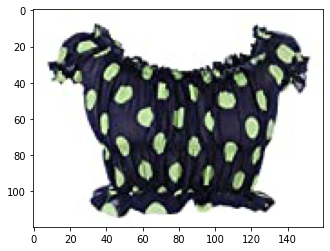

ASIN : B01D9B49LW
Brand : Sugar Lips
color : 2PACK: NUDE/WHITE
euclidean distance from input : 7.665091089147286


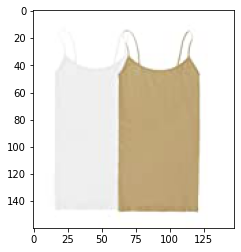

ASIN : B072HCVT7P
Brand : BODEN
color : Multi
euclidean distance from input : 8.426336125181837


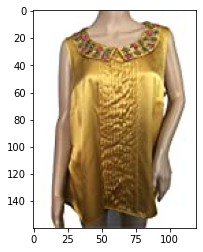

ASIN : B01LY1Z8IY
Brand : AriZona
color : Multi-color
euclidean distance from input : 8.485708810710273


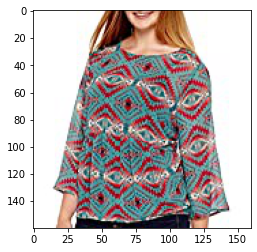

ASIN : B01D7T4BIC
Brand : Alice & Trixie
color : Black
euclidean distance from input : 8.493374087237678


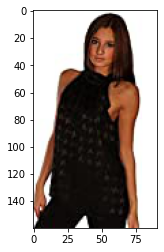

ASIN : B00Y9HREL8
Brand : Ai.Moichien
color : Black
euclidean distance from input : 8.528376438044868


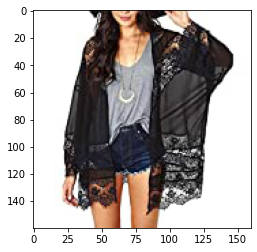

ASIN : B01MSA3SB8
Brand : Victoria's Secret
color : Green
euclidean distance from input : 8.533560514450073


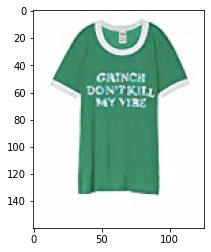

ASIN : B072WQ86QJ
Brand : FEIANNA
color : White Black Stripe
euclidean distance from input : 8.564755111496964


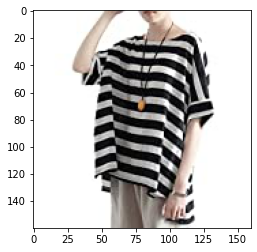

ASIN : B01J65ZE2I
Brand : Flying Cross
color : Blue
euclidean distance from input : 8.61389696598053


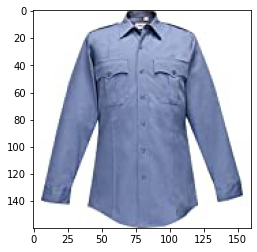

ASIN : B074MGFYFC
Brand : Isla
color : Pale Blue
euclidean distance from input : 8.623079850191182


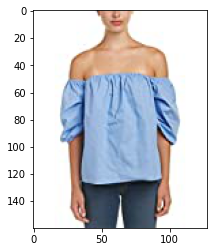

ASIN : B01MSYDNG5
Brand : Grace Elements
color : Coral Kiss
euclidean distance from input : 8.6459059715271


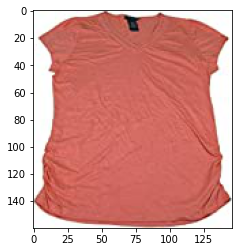

ASIN : B07486NTYQ
Brand : Aeneontrue
color : Dark Blue
euclidean distance from input : 8.663609101289815


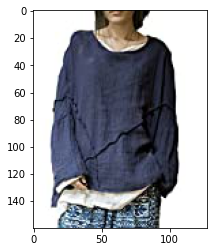

ASIN : B074TH83H1
Brand : BCBGMAXAZRIA
color : Bare Pink
euclidean distance from input : 8.66520855607923


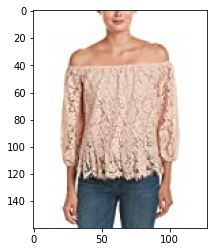

ASIN : B00Y8C6XEI
Brand : kensie
color : Blue Multi
euclidean distance from input : 8.707658125871724


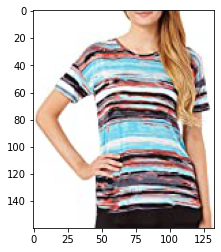

ASIN : B01KEQ5IGA
Brand : BCX
color : Coral
euclidean distance from input : 8.754703477667494


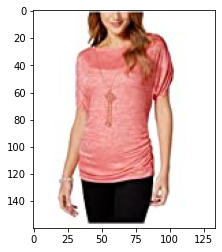

ASIN : B01GTF5X42
Brand : Madewell
color : Multi Color
euclidean distance from input : 8.833454110049567


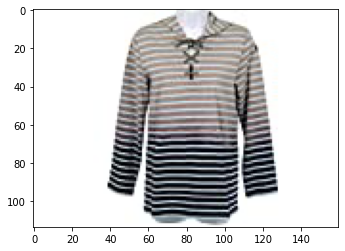

ASIN : B074P85Y4R
Brand : Dantelle
color : Blue
euclidean distance from input : 8.849701501750312


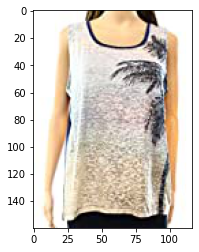

ASIN : B01MTV5CN5
Brand : White Stag
color : Pink Glow
euclidean distance from input : 8.85720443725586


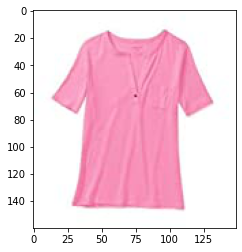

ASIN : B07229JP6M
Brand : MSK
color : Purple
euclidean distance from input : 8.86457033519618


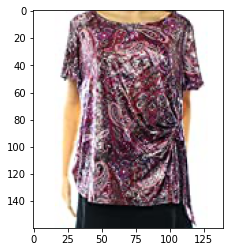

ASIN : B01LDW11EC
Brand : curvyluv.com
color : Black
euclidean distance from input : 8.866251685046516


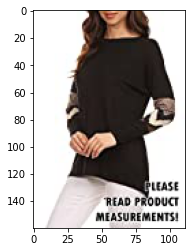

In [53]:
idf_w2v_brand(931, 1, 1, 1,1, 20)

<B>here we give a same weight to all feature and they try to find similar product using a all tha
feature.

1. here we have a amazon feshion data and our task is find to similar product for the use.

2. In this data we have 19 feature in these feature we most use a brand and color of product
and title of product and cloth image.

3. so for here we know our most info availble on the title feature hence we build a simple
model using a title feature and they work well.

4. then we use a title + color and brand feature, they return a very nice output for given query
product.

5. for the title feature a we use a different type of technique for to convert text to vector like
BOW, TFIDF, AVG-W2V, IDF-W2V, and for the color and brand we use a OneHotEncoding
and for the image we use a CNN (VGG16).

6. For the our task we use all these feature and apply a weighted eud-dist and try to predict a
similar product and using a different weight of all feature we predict a product here.